# [OpenCV](https://opencv.org)

Es una librería que open source creada por intel y está especializada en el sistema de visión artificial y machine learning. Con ella podemos realizar una amplia variedad de tareas relacionadas con la visión por computadora, como detección de movimiento, reconocimiento de objetos, reconstrucción 3D a partir de imágenes, etc.

Antes de ver operaciones con opencv vamos a ver que es una imagen o como las vamos a interpretar.

Para OpenCV, una imagen es una matriz estándar de Numpy que contiene píxeles de puntos de datos. Los píxeles son los elementos más pequeños de una imagen y contienen información sobre el color y la intensidad de la luz en un punto específico de la imagen. Las imágenes las opera en BGR (azul, verde, rojo) en lugar del formato RGB (rojo, verde, azul). Esto quiere decir que la matriz va a tener heightxwidthx3 (shape[0], shape[1], shape[3]), el 3 corresponde al componente (o canal) BGR. Ver imagen.

Explicación con una imagen en RGB, tengan en cuenta que está librería opera en BGR. Esto quiere decir que primero esta la capa azul, luego la verde y por último la roja. Por ejemplo el pixel B lo vemos como [0, 255, 127]

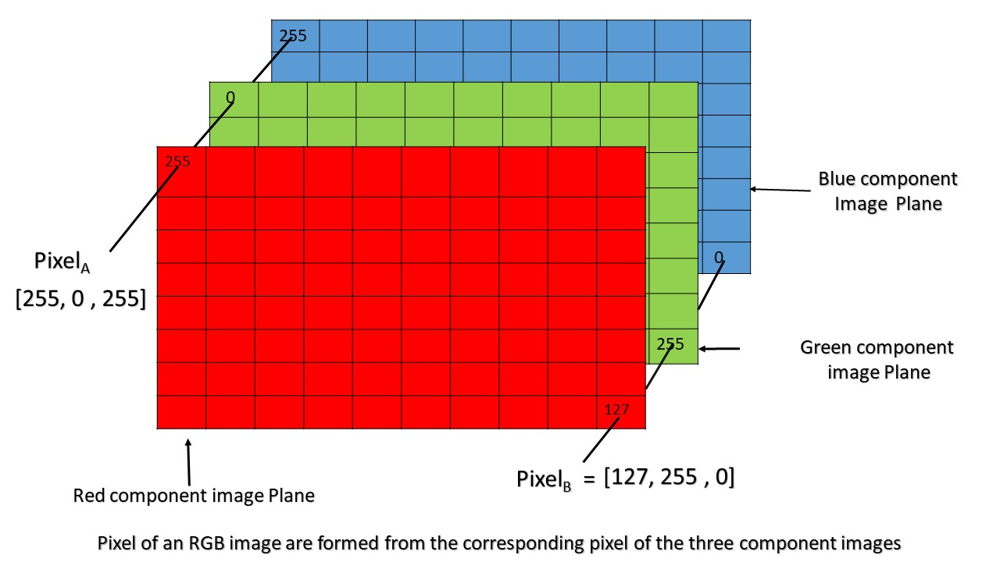


Algunas imágenes poseen un componente extra que se denomina alfa que nos indica el grado de transparencia de una imagen. Un valor de alfa de 0 significa que el píxel es completamente transparente, mientras que un valor de alfa de 255 significa que el píxel es completamente opaco.

Las imágenes que tienen un componente alfa se conocen como imágenes con canal alfa o imágenes RGBA (rojo, verde, azul, alfa). El canal alfa se utiliza para controlar la transparencia de los píxeles de la imagen y se utiliza a menudo en aplicaciones de edición de imágenes y gráficos para crear efectos de superposición y transparencia.

En OpenCV, puedes trabajar con imágenes con canal alfa utilizando la función imread para cargar la imagen y especificando el segundo argumento como -1 o cv2.IMREAD_UNCHANGED para cargar la imagen con su canal alfa original.

La librería también me permite trabajar con los componentes HSV o Tono, Saturación y Valor. El Tono representa la matiz del color que se está usando, la Saturación representa la cantidad en la que se usa el color y el Valor representa el brillo. Estos valores son utilizas para resolver los problemas relacionados con la visión por computadora debido a su mejor rendimiento en comparación con RGB y el rango de Tono es [0,179], el rango de Saturación es [0,255] y el rango de Valor es [0,255.

## Instalación

In [ ]:
!pip install opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Versión

In [ ]:
import cv2 as cv
cv.__version__

'4.7.0'

In [ ]:
import urllib.request
import numpy as np
# librería para poder mostrar las imágenes en colab
from google.colab.patches import cv2_imshow

## Descarga y apertura de una imagen

Para abrir una imagen utilizamos la función `imread` y para guardar una imagen utilizamos la función `imwrite`.

El formato de la imagen es jpg y tiene un tamaño de 2560x1600.jpg)

--2023-04-28 23:25:32--  https://drive.google.com/uc?id=1Us5ImLALAvCiqpXdLKhBgyO1PQ8S3YS3
Resolving drive.google.com (drive.google.com)... 108.177.12.138, 108.177.12.100, 108.177.12.101, ...
Connecting to drive.google.com (drive.google.com)|108.177.12.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-14-2k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/lcher83ghb93s177acrtjrlkodcur261/1682724300000/07019282373600526072/*/1Us5ImLALAvCiqpXdLKhBgyO1PQ8S3YS3?uuid=604393f5-30f3-4ea5-8d9c-2127a52abab8 [following]
--2023-04-28 23:25:33--  https://doc-14-2k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/lcher83ghb93s177acrtjrlkodcur261/1682724300000/07019282373600526072/*/1Us5ImLALAvCiqpXdLKhBgyO1PQ8S3YS3?uuid=604393f5-30f3-4ea5-8d9c-2127a52abab8
Resolving doc-14-2k-docs.googleusercontent.com (doc-14-2k-docs.googleusercontent.com)... 173.194.210.132, 2607:f8b0:400c:c0f::84
Connecting to doc-1

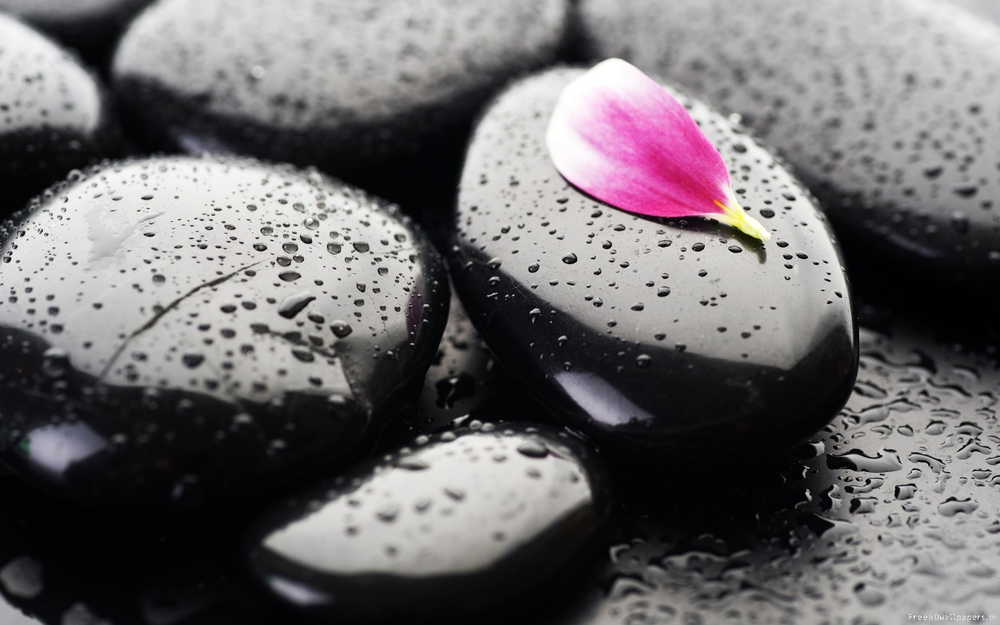

In [ ]:
# En este caso vamos a descargala desde un drive y la mostramos
# La imagen queda almacenada en /content

# url de la imagen
url = 'https://drive.google.com/uc?id=1Us5ImLALAvCiqpXdLKhBgyO1PQ8S3YS3'
# nombre del archivo
filename = "stones_wget.jpg"
# realizamos el wget para obtener la imagen
!wget {url} -O {filename}
# leemos la imagen con opencv, el segundo argumento
# esta relacionado a como quiere leer la imagen. Ver el link para mas tipos
# https://docs.opencv.org/3.4/d8/d6a/group__imgcodecs__flags.html#ga61d9b0126a3e57d9277ac48327799c80
# este segundo argumento está relacionado a si la quiero obtener en escala de grises
# a color, etc.
img = cv.imread(filename, cv.IMREAD_UNCHANGED)
# mostramos la imagen
cv2_imshow(img)

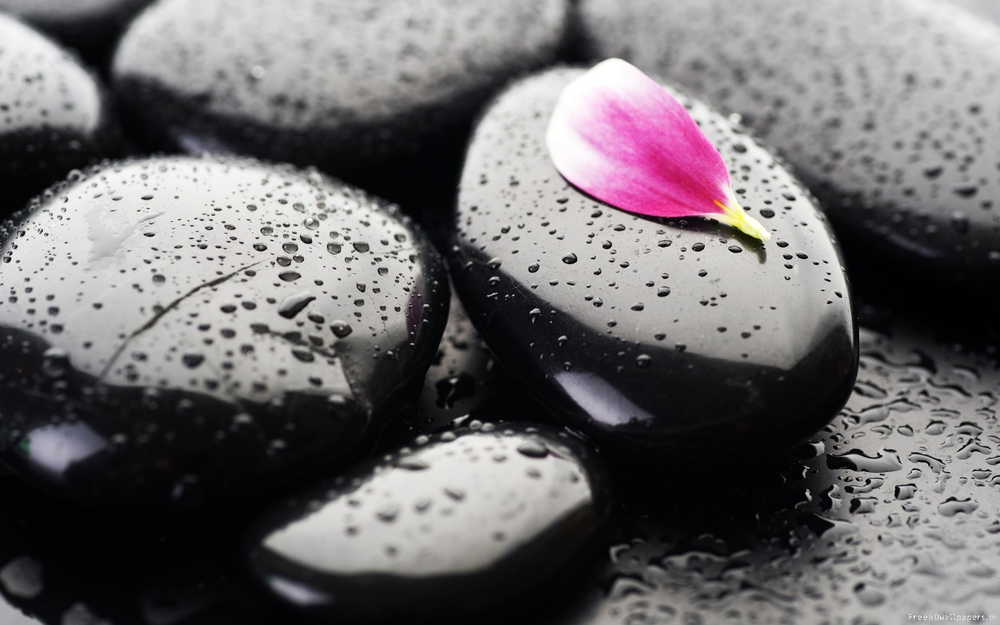

In [ ]:
# En este caso vamos a descargala desde un drive y la mostramos
# La imagen queda almacenada en /content

# nombre del archivo
filename = "stones_request.jpg"
# descargar la imagen y guardarla en un archivo temporal
with urllib.request.urlopen(url) as response:
  # obtengo el stream de bytes descargado
  stream = response.read()
  # transformo el stream en un array de numpy
  nparray = np.asarray(bytearray(stream), dtype=np.uint8)
  # decodifico una imagen a partir de un búfer de memoria, el segundo argumento
  # esta relacionado a como quiere leer la imagen. Ver el link para mas tipos
  # https://docs.opencv.org/3.4/d8/d6a/group__imgcodecs__flags.html#ga61d9b0126a3e57d9277ac48327799c80
  # este segundo argumento está relacionado a si la quiero obtener en escala de grises
  # a color, etc.
  img_request = cv.imdecode(nparray, cv.IMREAD_UNCHANGED)
# guardamos la imagen de forma física
cv.imwrite(filename, img_request)
# mostramos la imagen
cv2_imshow(img_request)

## Formato de una imagen

In [ ]:
print(f"El tipo de dato de la imagen es: {type(img)}")
print(f"El formato de la matriz es: {img.shape}")
print("Está matriz es de 3 dimensiones. La primer dimensión tiene 1600 celdas. Cada\n"\
      " un de estas celdas se transforma en una nueva dimensión que tiene 2560 celdas y \n"\
      "finalmente estas últimas celdes poseen un nparray de 3 dimensiones donde cada \n"\
      "posición tiene un entero entre 0 y 255.")
print("La dimensión de la primer posición es una matriz con: \n", img[0].shape)
print("La dimensión de la posición 0,0 es un nparray: \n", img[0][0].shape)
print()
print("Primer pixel (img[0,0]): ", img[0,0])
print("Componente azul del primer pixel (img[0,0,0]): ", img[0,0,0])
print("Componente verde del primer pixel (img[0,0,1]): ", img[0,0,1])
print("Componente rojo del primer pixel (img[0,0,2]): ", img[0,0,2])
print()
print("Como es la matriz: \n", img)

El tipo de dato de la imagen es: <class 'numpy.ndarray'>
El formato de la matriz es: (1600, 2560, 3)
Está matriz es de 3 dimensiones. La primer dimensión tiene 1600 celdas. Cada
 un de estas celdas se transforma en una nueva dimensión que tiene 2560 celdas y 
finalmente estas últimas celdes poseen un nparray de 3 dimensiones donde cada 
posición tiene un entero entre 0 y 255.
La dimensión de la primer posición es una matriz con: 
 (2560, 3)
La dimensión de la posición 0,0 es un nparray: 
 (3,)

Primer pixel (img[0,0]):  [161 156 155]
Componente azul del primer pixel (img[0,0,0]):  161
Componente verde del primer pixel (img[0,0,1]):  156
Componente rojo del primer pixel (img[0,0,2]):  155

Como es la matriz: 
 [[[161 156 155]
  [160 155 154]
  [158 153 152]
  ...
  [199 197 196]
  [199 197 196]
  [199 197 196]]

 [[158 153 152]
  [158 153 152]
  [157 152 151]
  ...
  [199 197 196]
  [199 197 196]
  [199 197 196]]

 [[155 150 149]
  [155 150 149]
  [156 151 150]
  ...
  [199 197 196]
  [

## Colores y split

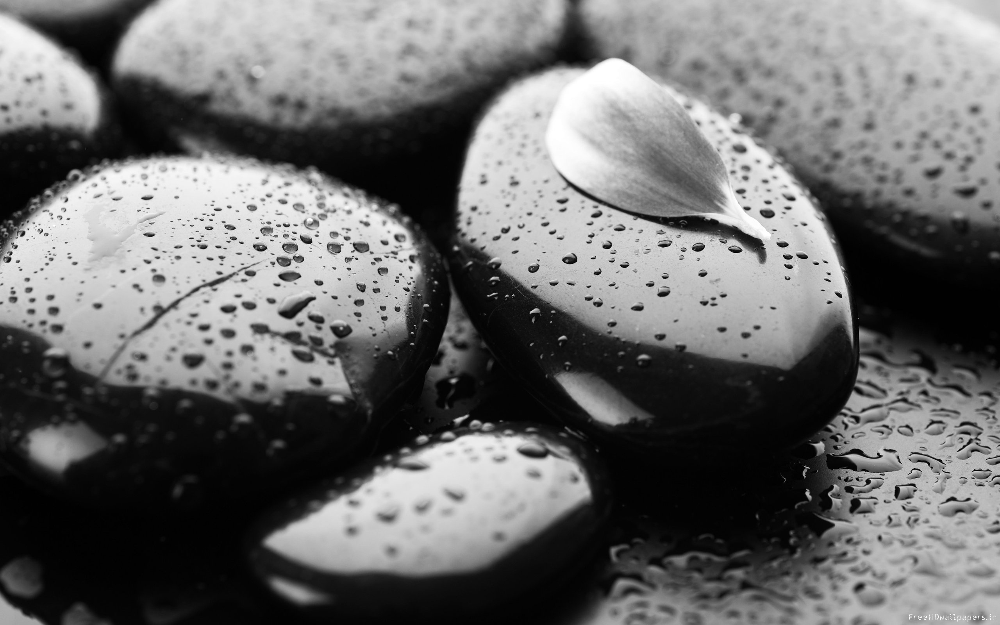

In [ ]:
# Convertimos la imagen a una escala de grises, para eso utilizamos la opción
# cv.COLOR_BGR2GRAY
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv2_imshow(img_gray)

In [ ]:
# Separamos la imagen en matrices de colores
red, green, blue = cv.split(img)
print(f"La matriz rojo tiene la forma: ", red.shape)
print(f"La matriz verde tiene la forma: ", green.shape)
print(f"La matriz azul tiene la forma: ", blue.shape)
print()
# Convertimos la imagen al espacio HSV
im_hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
# Separamos el HSV imagen las matrices de tono, saturación y valor
hue, saturation, value = cv.split(im_hsv)
print(f"La matriz tono tiene la forma: ", hue.shape)
print(f"La matriz saturación tiene la forma: ", saturation.shape)
print(f"La matriz valor tiene la forma: ", value.shape)


La matriz rojo tiene la forma:  (1600, 2560)
La matriz verde tiene la forma:  (1600, 2560)
La matriz azul tiene la forma:  (1600, 2560)

La matriz tono tiene la forma:  (1600, 2560)
La matriz saturación tiene la forma:  (1600, 2560)
La matriz valor tiene la forma:  (1600, 2560)


--2023-04-28 23:25:39--  https://drive.google.com/uc?id=1NjUu4KCzM8mjhqWHQdI96vws4ngRgwyk
Resolving drive.google.com (drive.google.com)... 108.177.12.138, 108.177.12.100, 108.177.12.101, ...
Connecting to drive.google.com (drive.google.com)|108.177.12.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0s-2k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/u2v55ke0fkoclsoktj1ftmnmdk36fd6b/1682724300000/07019282373600526072/*/1NjUu4KCzM8mjhqWHQdI96vws4ngRgwyk?uuid=9987e479-2e09-4b24-a2f1-3958317ca1ad [following]
--2023-04-28 23:25:39--  https://doc-0s-2k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/u2v55ke0fkoclsoktj1ftmnmdk36fd6b/1682724300000/07019282373600526072/*/1NjUu4KCzM8mjhqWHQdI96vws4ngRgwyk?uuid=9987e479-2e09-4b24-a2f1-3958317ca1ad
Resolving doc-0s-2k-docs.googleusercontent.com (doc-0s-2k-docs.googleusercontent.com)... 173.194.210.132, 2607:f8b0:400c:c0f::84
Connecting to doc-0

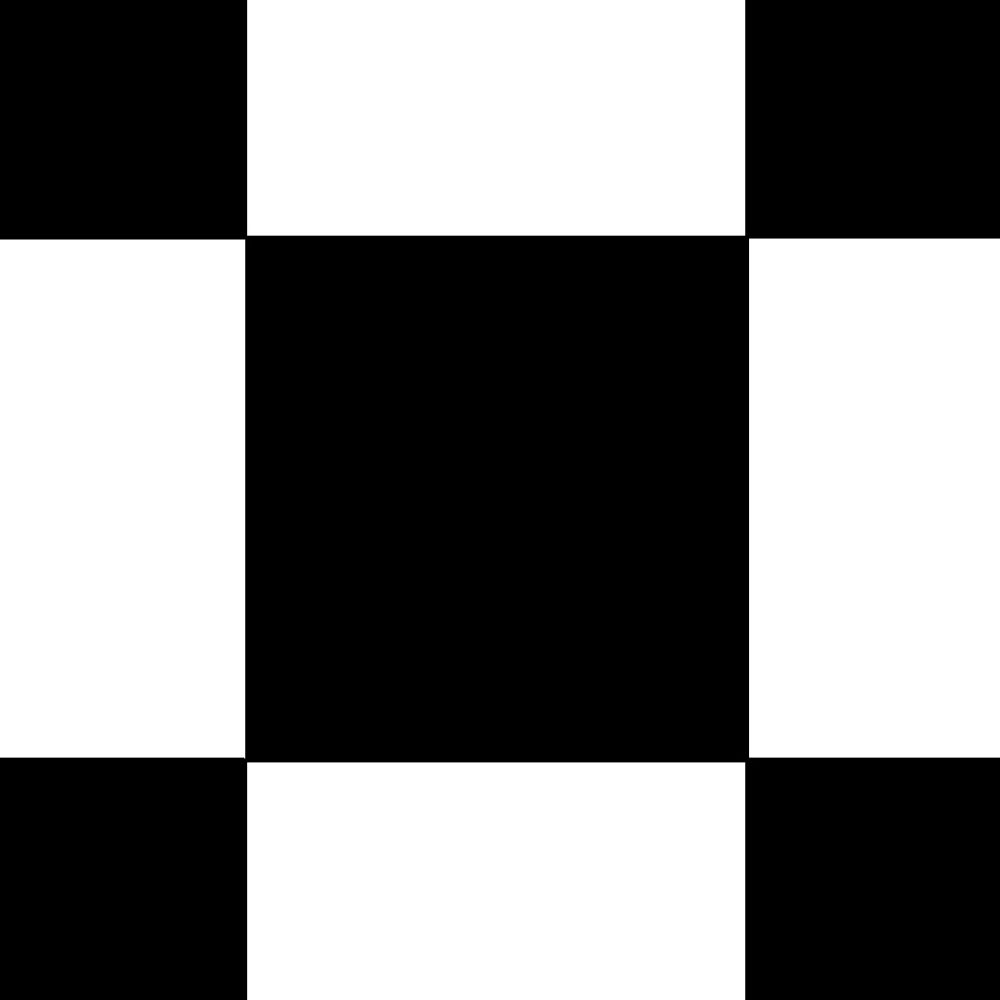

In [ ]:
# url de la imagen, tiene 186x186
url_black_and_white = 'https://drive.google.com/uc?id=1NjUu4KCzM8mjhqWHQdI96vws4ngRgwyk'

# nombre del archivo
filename_black_and_white = "black_and_white_squares-1048x1048.jpg"
# realizamos el wget
!wget {url_black_and_white} -O {filename_black_and_white}
# leemos la imagen con opencv
img_black_and_white = cv.imread(filename_black_and_white)
# mostramos la imagen
cv2_imshow(img_black_and_white)

In [ ]:
print(f"El tipo de dato de la imagen es: {type(img_black_and_white)}")
print(f"El formato de la matriz es: {img_black_and_white.shape}")
print("La dimensión de la primer posición es una matriz con: \n", img_black_and_white[0].shape)
print("La dimensión de la posición 0,0 es un nparray: \n", img_black_and_white[0][0].shape)
print("Como es la matriz: \n", img_black_and_white)

El tipo de dato de la imagen es: <class 'numpy.ndarray'>
El formato de la matriz es: (1048, 1048, 3)
La dimensión de la primer posición es una matriz con: 
 (1048, 3)
La dimensión de la posición 0,0 es un nparray: 
 (3,)
Como es la matriz: 
 [[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


Si comparamos las imágenes una posee colores y la otra no (blanco y negro).

Si observamos la primer imagen vemos que los valores de la matriz varian entre 0 y 255, mientras que en la última imagen que es en blanco y negro vemos que los valores son 0 o 255, pero la última posición que es la que hace referencia a los componentes sigue siendo 3 (los componentes son BGR).

El 0 representa al color negro y el 255 (FFFFFF) representa el blanco.

## [Kernel, Padding y step](https://drive.google.com/file/d/1gp3TesQSJZX9PfUmduWUdA_AZE79rhTF/view?usp=sharing)

> **Kernel**:
Es una matriz que se desplaza por toda la matriz para obtener distintos resultados. Entre ambas matrices se realizan  operaciones matemáticas. Son matrices cuadradas y los hay de distintos tamaños.

> **Padding**:
Es la operación de agregar filas y columnas a la matriz original. Esto lo hacemos para cambiar el tamaño de la matriz de salida y depende del tamaño del kernel. Por ejemplo si queremos mantener la dimensionalidad de la matriz original debemos hacer un padding (tamaño del kernel - 2), el 2 sale de que se agrega una fila arriba y otra abajo, y pasa lo mismo para las columnas.

> **Step**:
Es el paso que se utiliza para desplazar el kernel. Nuevamente este parámetro puede cambiar el tamaño de la matriz original.

El filtro es la combinación de estos 3 puntos.

En la imagen podemos observar la matriz original en azul, el kernel en gris claro sobre la matriz original, en interlineado el padding y la proyección del kernel en verde.

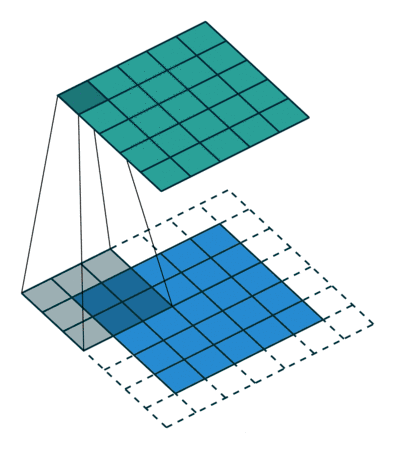

Vamos a explicarlo con valores.

In [ ]:
# vamos a crear una matriz de 12x12 donde podemos suponer que hay cuadrados en
# color blanco (255) y negro (0)
matriz = np.asarray([[ 0,   0,   0,   0,   255, 255, 255, 255, 0,   0,   0,   0],
                      [0,   0,   0,   0,   255, 255, 255, 255, 0,   0,   0,   0],
                      [0,   0,   0,   0,   255, 255, 255, 255, 0,   0,   0,   0],
                      [0,   0,   0,   0,   255, 255, 255, 255, 0,   0,   0,   0],
                      [255, 255, 255, 255, 0,   0,   0,   0,   255, 255, 255, 255],
                      [255, 255, 255, 255, 0,   0,   0,   0,   255, 255, 255, 255],
                      [255, 255, 255, 255, 0,   0,   0,   0,   255, 255, 255, 255],
                      [255, 255, 255, 255, 0,   0,   0,   0,   255, 255, 255, 255],
                      [0,   0,   0,   0,   255, 255, 255, 255, 0,   0,   0,   0],
                      [0,   0,   0,   0,   255, 255, 255, 255, 0,   0,   0,   0],
                      [0,   0,   0,   0,   255, 255, 255, 255, 0,   0,   0,   0],
                      [0,   0,   0,   0,   255, 255, 255, 255, 0,   0,   0,   0]])
# kernel que vamos a utilizar para detectar bordes
kernel = np.asarray([[-1, -1, -1],
                      [-1, 8, -1],
                      [-1, -1, -1]])

print("Matriz original: \n", matriz)
print("kernel: \n", kernel)
print()

# PADDING=1 (tamaño del kernel - 2) = (3-2)
# agrego una fila arriba porque no quiero cambiar el tamaño de la matriz
matriz_padding = np.concatenate(
    (np.expand_dims(np.zeros(matriz.shape[1]), axis=0), matriz))
# agrego una fila abajo porque no quiero cambiar el tamaño de la matriz
matriz_padding = np.concatenate(
    (matriz_padding, np.expand_dims(np.zeros(matriz_padding.shape[1]), axis=0)))
# agrego una columna a la derecha porque no quiero cambiar el tamaño de la matriz
matriz_padding = np.concatenate(
    (matriz_padding, np.expand_dims(np.zeros(matriz_padding.shape[0]), axis=1)),
    axis=1)
# agrego una columna a la izquierda porque no quiero cambiar el tamaño de la matriz
matriz_padding = np.concatenate(
    (np.expand_dims(np.zeros(matriz_padding.shape[0]), axis=1), matriz_padding),
    axis=1)

print("Luego de agregar el padding de 1, la matriz me queda con la siguiente forma: \n", matriz_padding)
resp = []
kernel_size = kernel.shape[1]
# STEP=1
# recorro las filas
for fila in range(matriz_padding.shape[0]-kernel_size+1):
  resultados = []
  # recorro las columnas
  for columna in range(matriz_padding.shape[1]-kernel_size+1):
    # hago un slice de la matriz con padding por las filas y las columnas y
    # cada slice lo multiplico con el kernel, esta operación me devuelve una
    # matriz de 3x3 y luego sumo todos los valores de esta matriz.
    resultados.append(np.sum(np.multiply(matriz_padding[fila:fila+kernel_size, columna:columna+kernel_size], kernel)))
  resp.append(resultados)

matriz_resultado = np.asarray(resp)
print(f"La matriz original es {matriz.shape}: \n", matriz)
print()
print(f"La matriz con padding es {matriz_padding.shape}: \n", matriz_padding)
print()
print(f"La matriz resultado es {matriz_resultado.shape}: \n", matriz_resultado)
print()
matriz_borde = matriz_resultado.copy()
# si el valor es positivo, entonces pongo un 1 sin importar que valor sea
matriz_borde[matriz_borde>0] = 1
# si el valor es negativo, entonces pongo un 0 sin importar que valor sea
matriz_borde[matriz_borde<0] = 0
print("Como podemos ver, los bordes me quedan con valor 1.")
print(f"La matriz resultado es {matriz_borde.shape}: \n", matriz_borde)

Matriz original: 
 [[  0   0   0   0 255 255 255 255   0   0   0   0]
 [  0   0   0   0 255 255 255 255   0   0   0   0]
 [  0   0   0   0 255 255 255 255   0   0   0   0]
 [  0   0   0   0 255 255 255 255   0   0   0   0]
 [255 255 255 255   0   0   0   0 255 255 255 255]
 [255 255 255 255   0   0   0   0 255 255 255 255]
 [255 255 255 255   0   0   0   0 255 255 255 255]
 [255 255 255 255   0   0   0   0 255 255 255 255]
 [  0   0   0   0 255 255 255 255   0   0   0   0]
 [  0   0   0   0 255 255 255 255   0   0   0   0]
 [  0   0   0   0 255 255 255 255   0   0   0   0]
 [  0   0   0   0 255 255 255 255   0   0   0   0]]
kernel: 
 [[-1 -1 -1]
 [-1  8 -1]
 [-1 -1 -1]]

Luego de agregar el padding de 1, la matriz me queda con la siguiente forma: 
 [[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.]
 [  0.   0.   0.   0.   0. 255. 255. 255. 255.   0.   0.   0.   0.   0.]
 [  0.   0.   0.   0.   0. 255. 255. 255. 255.   0.   0.   0.   0.   0.]
 [  0.   0.   0.   0. 

In [ ]:
# AVANZADO Y OPTIMIZADOS
#
# REPETIMOS LAS OPERACIONES DE LA CELDA ANTERIOR PERO DE UNA FORMA MAS EFICIENTE
#
# en lugar de utilizar el doble for para recorrer las filas y las columnas
# para hacer el slicing, podemos utilizar la siguiente porción de código
from numpy.lib.stride_tricks import as_strided
# as_strided, me genera 12 matrices filas y 12 matrices columnas de 3x3 (osea lo que debo
#   generara con el slicing)
#   recordar que la matriz_padding tiene una forma de 14x14 y ahora necesito obtener
#   matrices de 12x12, es por esto que se le resta 2 al shape
sub_matrices = as_strided(matriz_padding,
                    shape=(matriz_padding.shape[0]-2, matriz_padding.shape[1]-2, kernel.shape[0], kernel.shape[0]),
                    strides=matriz_padding.strides + matriz_padding.strides)
# en la variable sub_matrices tiene la forma de 12x12x3x3, entonces
# debo multiplicar cada matriz 3x3 por el kernel que es de 3x3 y el resultado
# es una nueva matriz de 12x12x3x3
multiplicacion_sub_matrices = np.multiply(sub_matrices, kernel)
# ahora debo sumar los componentes las matrices de 3x3 para obtener una nueva
# matriz de 12x12, en este caso el argumento axis contiene las dimensiones a sumar
# recordar que con valores negativos estoy leyendo las posiciones de la última a la primera
suma_sub_matrices = np.sum(multiplicacion_sub_matrices, axis=(-1,-2))
print(f"La matriz original es {matriz.shape}: \n", matriz)
print()
print(f"La matriz con padding es {matriz_padding.shape}: \n", matriz_padding)
print()
print(f"La matriz resultado es {suma_sub_matrices.shape}: \n", suma_sub_matrices)
print()
matriz_borde_optimizado = suma_sub_matrices.copy()
# si el valor es positivo, entonces pongo un 1 sin importar que valor sea
matriz_borde_optimizado[matriz_borde_optimizado>0] = 1
# si el valor es negativo, entonces pongo un 0 sin importar que valor sea
matriz_borde_optimizado[matriz_borde_optimizado<0] = 0
print("Como podemos ver, los bordes me quedan con valor 1.")
print(f"La matriz resultado es {matriz_borde_optimizado.shape}: \n", matriz_borde_optimizado)

print()
print("Comparabamos la matriz que obtuvimos con los for y la que obtuvimos de manera avanzada")
print(matriz_borde_optimizado == matriz_borde)

La matriz original es (12, 12): 
 [[  0   0   0   0 255 255 255 255   0   0   0   0]
 [  0   0   0   0 255 255 255 255   0   0   0   0]
 [  0   0   0   0 255 255 255 255   0   0   0   0]
 [  0   0   0   0 255 255 255 255   0   0   0   0]
 [255 255 255 255   0   0   0   0 255 255 255 255]
 [255 255 255 255   0   0   0   0 255 255 255 255]
 [255 255 255 255   0   0   0   0 255 255 255 255]
 [255 255 255 255   0   0   0   0 255 255 255 255]
 [  0   0   0   0 255 255 255 255   0   0   0   0]
 [  0   0   0   0 255 255 255 255   0   0   0   0]
 [  0   0   0   0 255 255 255 255   0   0   0   0]
 [  0   0   0   0 255 255 255 255   0   0   0   0]]

La matriz con padding es (14, 14): 
 [[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.]
 [  0.   0.   0.   0.   0. 255. 255. 255. 255.   0.   0.   0.   0.   0.]
 [  0.   0.   0.   0.   0. 255. 255. 255. 255.   0.   0.   0.   0.   0.]
 [  0.   0.   0.   0.   0. 255. 255. 255. 255.   0.   0.   0.   0.   0.]
 [  0.   0.   0.   0.  

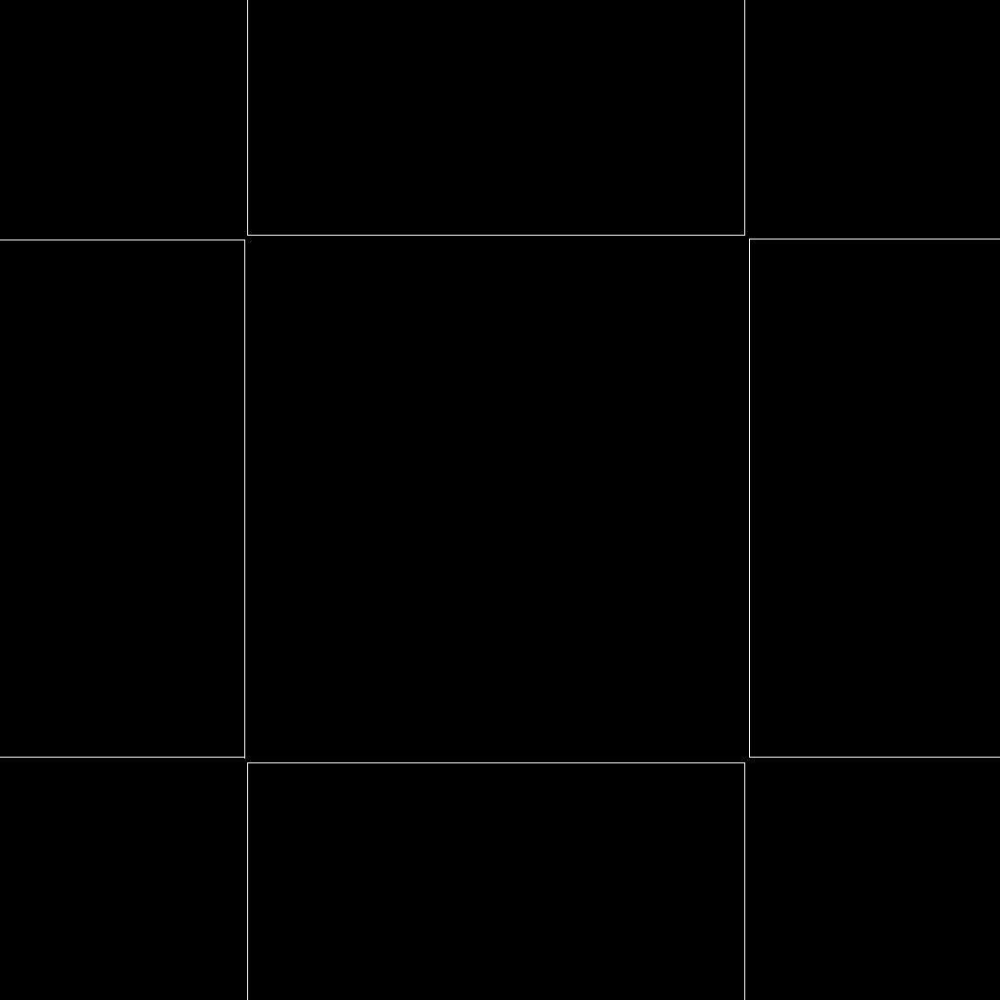

In [ ]:
# este es el kernel para detectar bordes
# dentro la librería podemos utilizar la función "cv.Canny"
kernel_canny_horizontal = np.array([
    [-1, -1, -1],
    [-1, 8, -1],
    [-1, -1, -1]], np.float32)
# aplicamos el kernel y obtenemos una nueva imagen donde
# se exponen más los bordes de la figura
img_canny_horizontal = cv.filter2D(img_black_and_white, -1, kernel_canny_horizontal)
cv2_imshow(img_canny_horizontal)

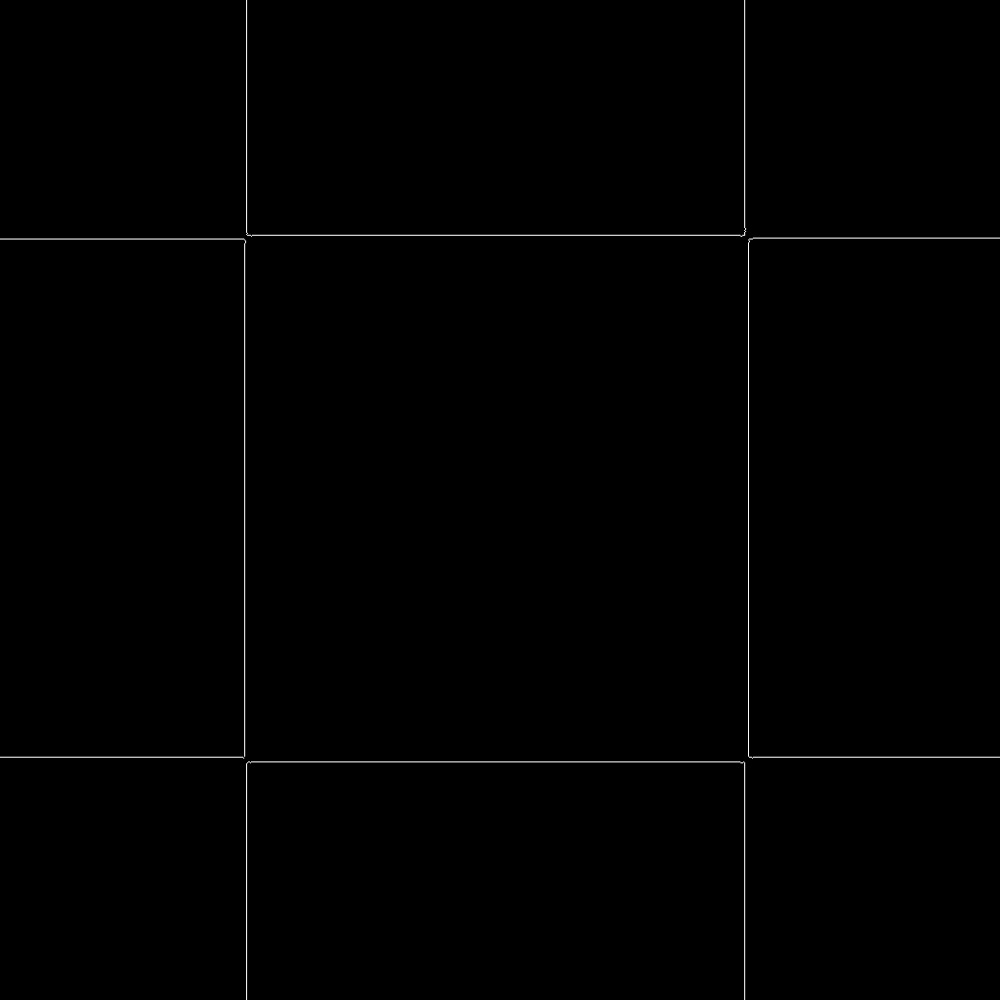

In [ ]:
# cv.Canny(img, threshold1, threshold2)
# Los umbrales threshold1 y threshold2 son los valores más importantes que debemos
# ajustar para obtener buenos resultados con cv2.Canny. Estos umbrales se
# utilizan en el procedimiento de histéresis para determinar si un píxel es un
# borde fuerte, un borde débil o no es un borde. Los bordes fuertes son aquellos
# píxeles cuyo valor de gradiente es mayor que threshold2, mientras que los
# bordes débiles son aquellos píxeles cuyo valor de gradiente está entre
# threshold1 y threshold2
# https://es.wikipedia.org/wiki/Hist%C3%A9resis
sobel_horizontal = cv.Canny(img_black_and_white, 100, 100*2)
cv2_imshow(sobel_horizontal)

## Resize

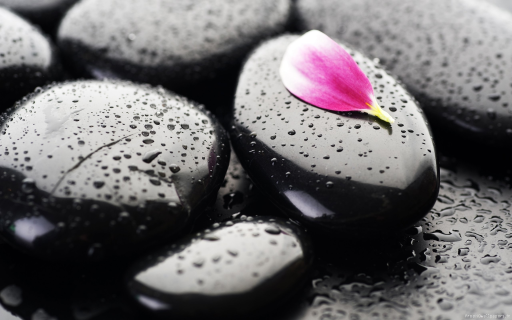

In [ ]:
# aplicamos un porcentaje para el resize
porcentaje = 20
# calculamos el nuevo width o ancho
height = img.shape[0] * porcentaje // 100
# calculamos el nuevo height o alto
width = img.shape[1] * porcentaje // 100
# aplicamos el resize, para esto le pasamos la imagen
# una tupla con los nuevos valores de alto y ancho y
# por último el tipo de interpolación que va a utilizar para
# remapear los valores de la matriz
img_resize = cv.resize(img, (height, width), interpolation=cv.INTER_AREA)
# mostramos la nueva imagen
cv2_imshow(img_resize)

## Dilate y Erode


Erode y Dilate son operaciones morfológica,ambas operaciones trabajan con una imagen binaria y un kernel.

La operación `erode` elimina los píxeles en los bordes de los objetos en primer plano (píxeles blancos) en una imagen binaria. Esto hace que los objetos en primer plano se vuelvan más pequeños.


La operación `dilate`, agrega píxeles a los bordes de los objetos en primer plano en una imagen binaria. Esto hace que los objetos en primer plano se vuelvan más grandes.

--2023-04-28 23:25:40--  https://drive.google.com/uc?id=1BaVBuT03TXrqC_UZb9T51kEjJGC0vlei
Resolving drive.google.com (drive.google.com)... 108.177.12.138, 108.177.12.100, 108.177.12.101, ...
Connecting to drive.google.com (drive.google.com)|108.177.12.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-08-2k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/4b2vuq7hqk8iq7kum38k61r57n78fbaa/1682724300000/07019282373600526072/*/1BaVBuT03TXrqC_UZb9T51kEjJGC0vlei?uuid=cd6c1bcd-a6c5-4082-896a-8dc9daeaf54a [following]
--2023-04-28 23:25:40--  https://doc-08-2k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/4b2vuq7hqk8iq7kum38k61r57n78fbaa/1682724300000/07019282373600526072/*/1BaVBuT03TXrqC_UZb9T51kEjJGC0vlei?uuid=cd6c1bcd-a6c5-4082-896a-8dc9daeaf54a
Resolving doc-08-2k-docs.googleusercontent.com (doc-08-2k-docs.googleusercontent.com)... 173.194.210.132, 2607:f8b0:400c:c0f::84
Connecting to doc-0

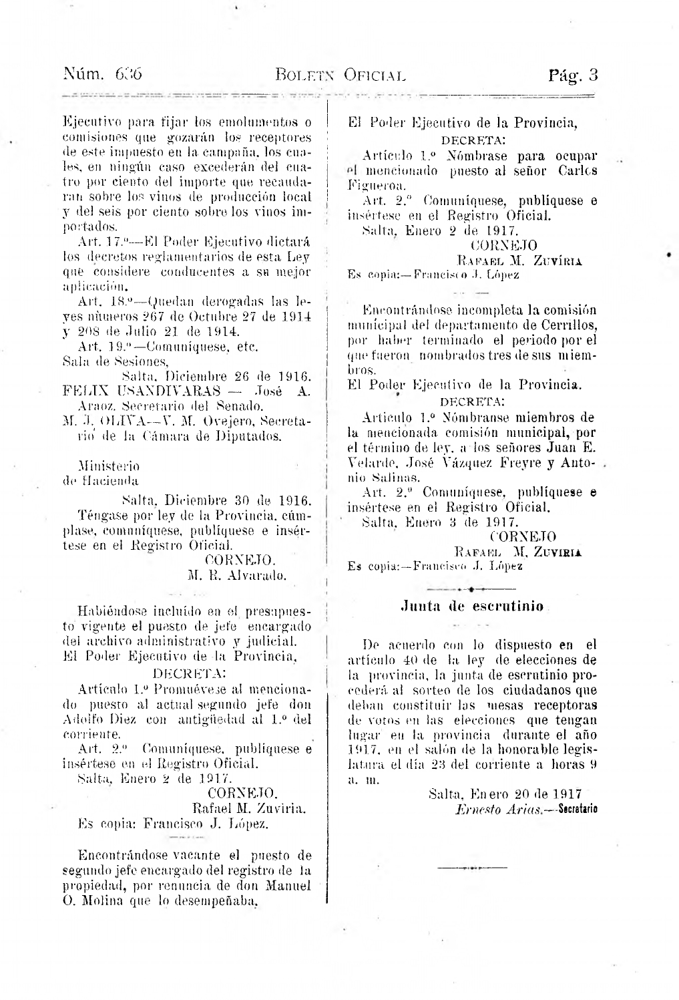

In [ ]:
# esta es una página de un pdf
url = 'https://drive.google.com/uc?id=1BaVBuT03TXrqC_UZb9T51kEjJGC0vlei'
filename = "ley_salta.jpg"
!wget {url} -O {filename}
img_ley_salta = cv.imread(filename, cv.IMREAD_UNCHANGED)
cv2_imshow(img_ley_salta)

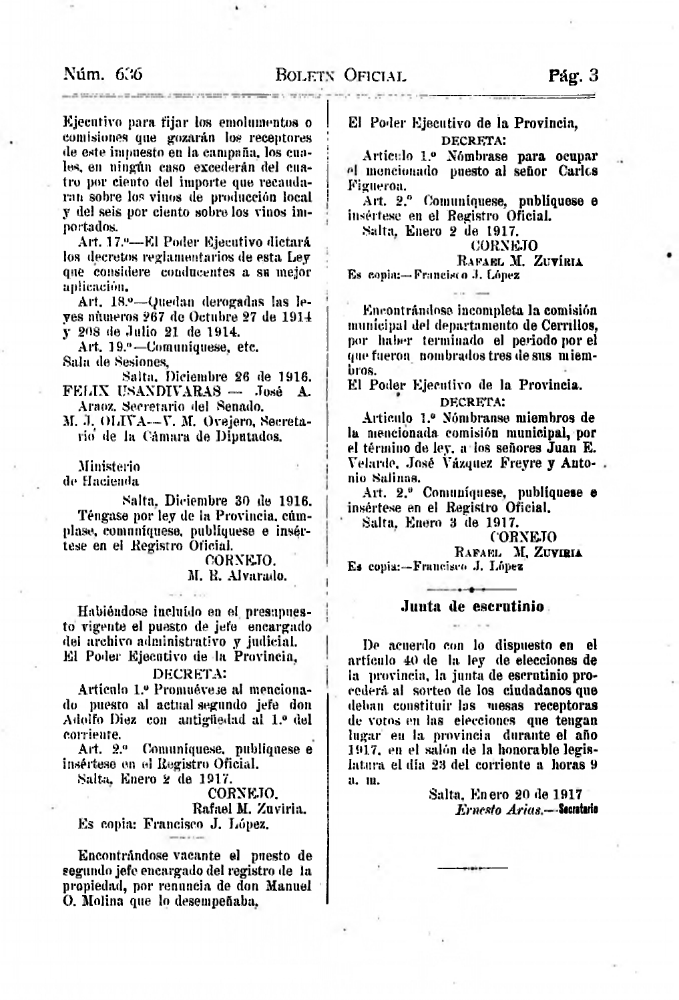

In [ ]:
# kernel 2x2
kernel = np.ones((2,2), np.uint8)
# en este caso el erode al eliminar ciertos puntos blancos
# genera el efecto de hacer mas gruesas las letras
cv2_imshow(cv.erode(img_ley_salta, kernel))

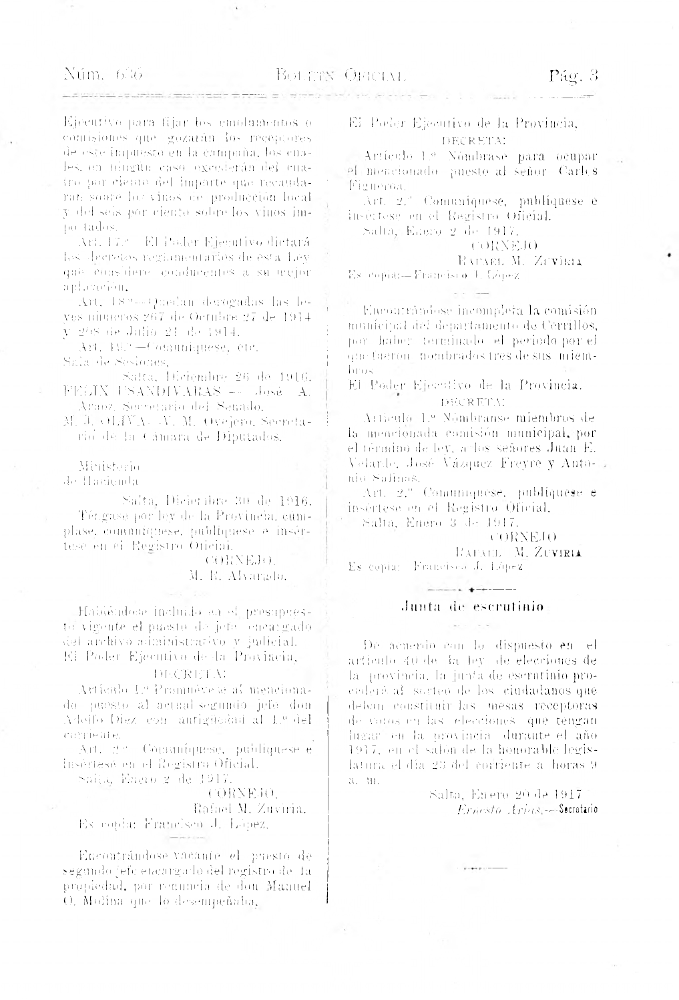

In [ ]:
# kernel 2x2
kernel = np.ones((2,2), np.uint8)
# en este caso el erode al agregar ciertos puntos blancos
# genera el efecto de hacer mas finas las letras
cv2_imshow(cv.dilate(img_ley_salta, kernel))

## Recorte de una imagen

Formato original de la imagen: (1600, 2560, 3)
Formato original de la imagen: (512, 512, 3)


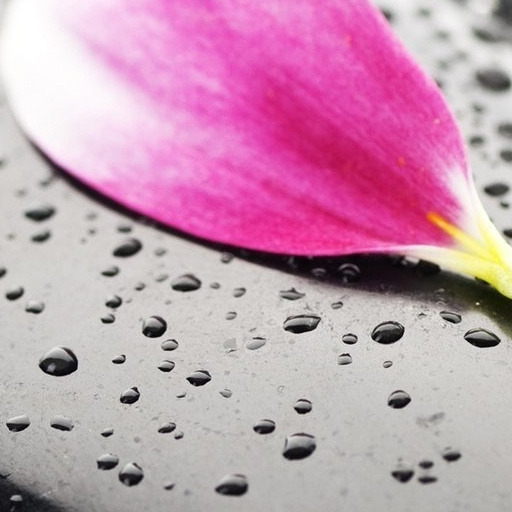

In [ ]:
# vamos a trabajar con la imagen de las rocas
print(f"Formato original de la imagen: {img.shape}")
tamanio_recorte = 512
posicion_alto = 300
posicion_ancho = 1400
# para hacer un recorte solo debemos hacer un slice del array
img_clipping = img[posicion_alto:posicion_alto+tamanio_recorte, posicion_ancho:posicion_ancho+tamanio_recorte,:]
print(f"Formato original de la imagen: {img_clipping.shape}")
cv2_imshow(img_clipping)

## Borrado de una sección

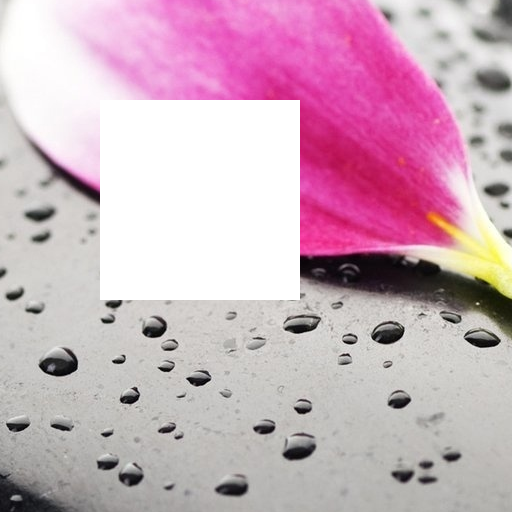

In [ ]:
# vamos a trabajar con el zoom de la imagen de las rocas
img_clipping_borrado = img_clipping.copy()
# vamos a borrar un cuadrado de 200x200 pixeles
tamanio_borrado = 200
# posición alta donde vamos a comenzar a eliminar los pixeles
alto_borrado = 100
# posición ancho donde vamos a comenzar a eliminar los pixeles
ancho_borrado = 100
# asignamos el colo blanco (255) a los componentes BGR
img_clipping_borrado[alto_borrado:alto_borrado+tamanio_borrado,
                    ancho_borrado:ancho_borrado+tamanio_borrado,:]=255
cv2_imshow(img_clipping_borrado)

## Threshold (umbrales)

Es un método de segmentación más simple. Me permite separar regiones de una imagen correspondientes a objetos que queremos analizar. Esta separación se basa en la variación de intensidad entre los píxeles del objeto y los del fondo.

La función toma un parámetro `thresh` como umbral y dependiendo del tipo aplica el parámetro `maxval`.

[Ver Tipos](https://docs.opencv.org/4.x/d7/d1b/group__imgproc__misc.html#gaa9e58d2860d4afa658ef70a9b1115576)


Tipo: cv.THRESH_BINARY
Si el valor es mayor a threshold (127) entonces pongo maxval (240) en caso contrario pongo 0


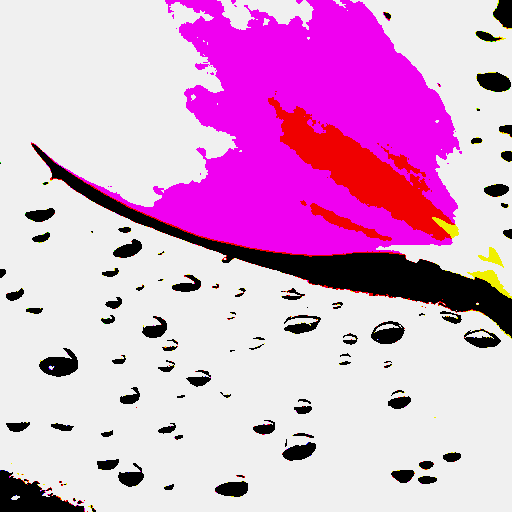


Tipo: cv.THRESH_BINARY
Si el valor es menor a threshold (127) entonces pongo maxval (240) en caso contrario pongo 0 (negro)


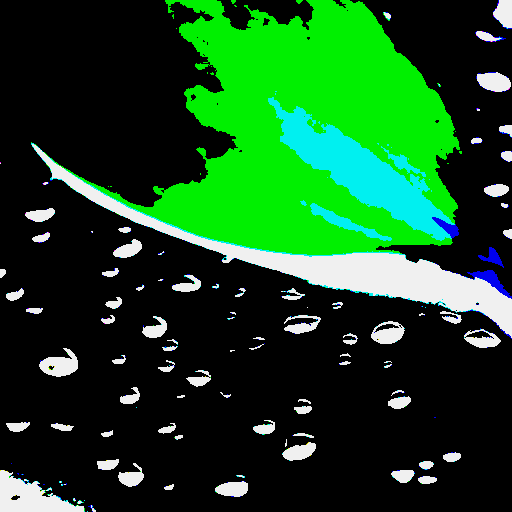


Tipo: cv.THRESH_TRUNC
No se utiliza maxval pero se tiene que pasar
Si el valor es mayor a threshold (127) pongo threshold (127), sino dejo el valor actual


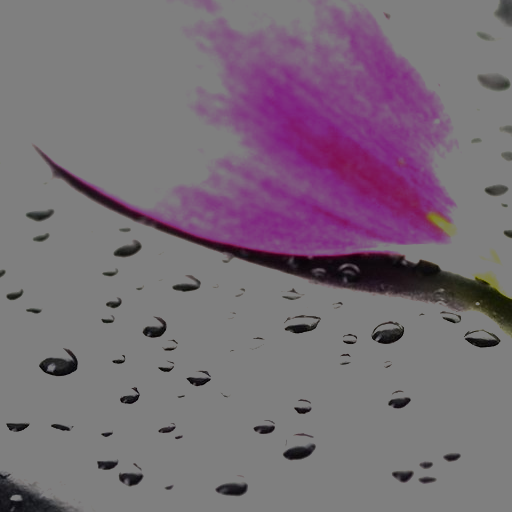


Tipo: cv.THRESH_TOZERO
No se utiliza maxval pero se tiene que pasar
Si el valor es mayor a threshold (127) dejo el valor, sino pongo 0 (negro)


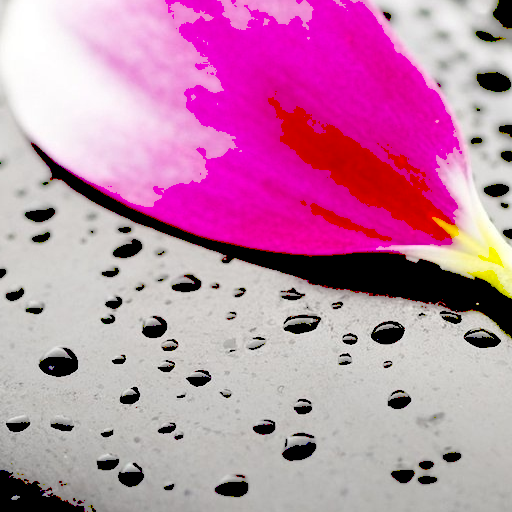


Tipo: cv.THRESH_MASK
No se utiliza maxval pero se tiene que pasar
Si el valor es menor a threshold (127) dejo el valor, sino pongo 0 (negro)


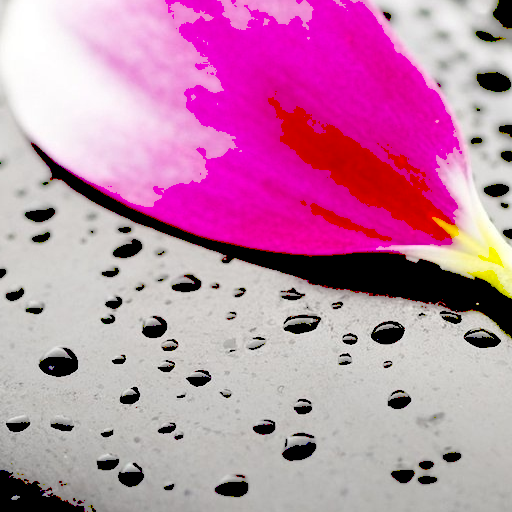

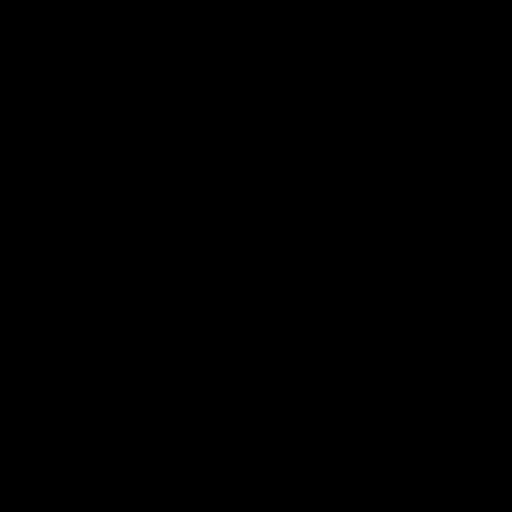

In [ ]:
threshold = 127
maxval = 240

print()
print("Tipo: cv.THRESH_BINARY")
print(f"Si el valor es mayor a threshold ({threshold}) entonces pongo maxval ({maxval}) en caso contrario pongo 0")
_, dst = cv.threshold(src=img_clipping.copy(), thresh=threshold, maxval=maxval, type=cv.THRESH_BINARY)
cv2_imshow(dst)

print()
print("Tipo: cv.THRESH_BINARY_INV")
print(f"Si el valor es menor a threshold ({threshold}) entonces pongo maxval ({maxval}) en caso contrario pongo 0 (negro)")
_, dst = cv.threshold(src=img_clipping.copy(), thresh=threshold, maxval=maxval, type=cv.THRESH_BINARY_INV)
cv2_imshow(dst)

print()
print("Tipo: cv.THRESH_TRUNC")
print("No se utiliza maxval pero se tiene que pasar")
print(f"Si el valor es mayor a threshold ({threshold}) pongo threshold ({threshold}), sino dejo el valor actual")
_, dst = cv.threshold(src=img_clipping.copy(), thresh=threshold, maxval=maxval, type=cv.THRESH_TRUNC)
cv2_imshow(dst)

print()
print("Tipo: cv.THRESH_TOZERO")
print("No se utiliza maxval pero se tiene que pasar")
print(f"Si el valor es mayor a threshold ({threshold}) dejo el valor, sino pongo 0 (negro)")
_, dst = cv.threshold(src=img_clipping.copy(), thresh=threshold, maxval=maxval, type=cv.THRESH_TOZERO)
cv2_imshow(dst)

print()
print("Tipo: cv.THRESH_MASK")
print("No se utiliza maxval pero se tiene que pasar")
print(f"Si el valor es menor a threshold ({threshold}) dejo el valor, sino pongo 0 (negro)")
cv2_imshow(dst)
_, dst = cv.threshold(src=img_clipping.copy(), thresh=threshold, maxval=maxval, type=cv.THRESH_MASK)
cv2_imshow(dst)

## Dibujando y escribiendo sobre una imagen

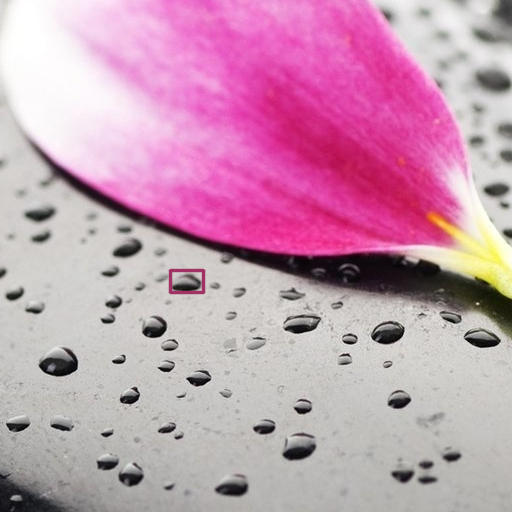

In [ ]:
# punto de inicio del rectángulo
dot_1 = (170,292)
# punto de fin del rectángulo
dot_2 = (203,270)
# color del rectángulo
color = (100,50,160)
# los parámetros son: imagen, punto 1, punto 2, color y espesor de la línea y tipo de línea
img_clipping_rectangle = cv.rectangle(img_clipping.copy(),
                                      dot_1, dot_2,
                                      color, 2, cv.LINE_AA)
cv2_imshow(img_clipping_rectangle)


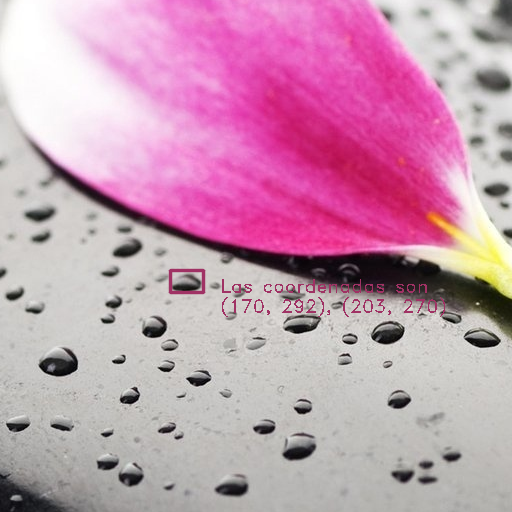

In [ ]:
# selecciono el tipo de letra
font = cv.FONT_HERSHEY_DUPLEX
# selecciono una escala para la letra
fontScale = 0.6

# punto de inicio donde se comienza a escribir
position = (dot_1[0]+50,dot_1[1])
# color de la letra
fontColor = color

img_clipping_rectangle_text = img_clipping_rectangle.copy()
# agrego el texto con los argumentos que definimos antes
cv.putText(img_clipping_rectangle_text,f'Las coordenadas son', position, font, fontScale, fontColor)
# Calculo una nueva posición
position = (position[0],position[1]+20)
cv.putText(img_clipping_rectangle_text,f'{dot_1}, {dot_2}', position, font, fontScale, fontColor)
# muestro la imagen
cv2_imshow(img_clipping_rectangle_text)


## Aplicando transparencias

Para esto necesitamos crear el componente alpha.

Forma imagen original:  (512, 512, 3)
Forma imagen con componente alpha:  (512, 512, 4)
Observar que la nueva imagen posee una posición mas.



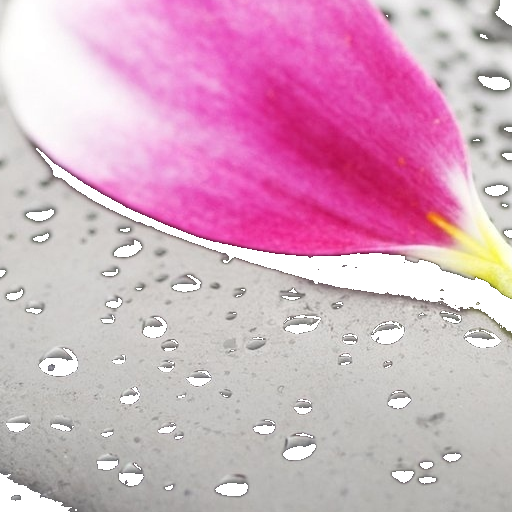

In [ ]:
# tomamos la imagen recortada
img_clipping_transparente = img_clipping.copy()
# Convertimos la imagen a HSV y tomamos el componente V o valor
V = cv.cvtColor(img_clipping_transparente,cv.COLOR_BGR2HSV)[...,2]

# Aplicamos un threshold sobre el componente V a 100 para crear el componente A o alpha
_, A = cv.threshold(V,100,255,cv.THRESH_BINARY)

# Agregamos el componente alpha a la imagen
img_clipping_transparente_alpha = np.dstack((img_clipping_transparente,A))

print(f"Forma imagen original: ", img_clipping_transparente.shape)
print(f"Forma imagen con componente alpha: ", img_clipping_transparente_alpha.shape)
print("Observar que la nueva imagen posee una posición mas.")
print()
cv2_imshow(img_clipping_transparente_alpha)

## Mostrando un histograma

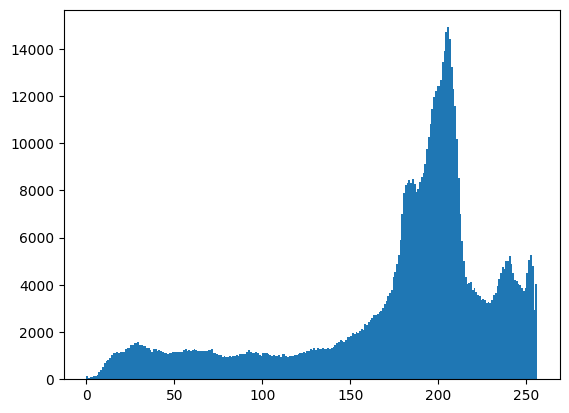

In [ ]:
from matplotlib import pyplot as plt
# la función ravel me transforma la matriz en un arreglo unidimensional concatenando
# las filas, es decir, pone una a continuación de la otra.
plt.hist(img_clipping.ravel(),256,[0,256]);
plt.show()

## Negativo de una imagen

Para hacer el negativo de una imagen utilizamos el simbolo `~`.

La negación binaria es:

| Binario | Negación |
| --- | --- |
| 1 | 0 |
| 0 | 1 |


Este simbolo es la negación binaria y funciona de la siguiente forma.

| Entero | Valor binario | Negación binaria | Entero |
| --- | --- | --- | --- |
| 0 | +0 | -1 | -1 |
| 1 | +1 | -10 | -2 |
| 2 | +10 | -101 | -3 |
| 3 | +11 | -100 | -4 |


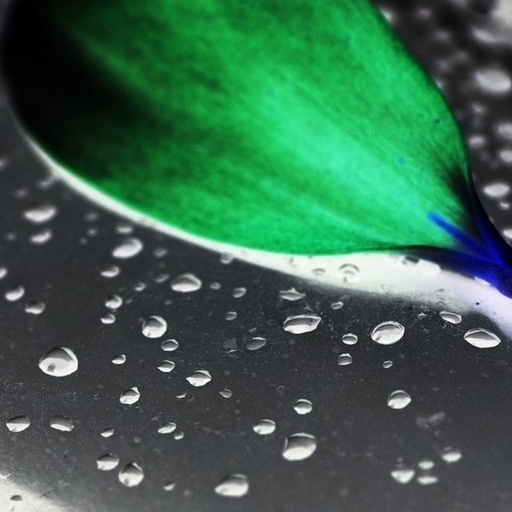

In [ ]:
# tomamos la imagen recortada
img_negaive = img_clipping.copy()

cv2_imshow(~img_negaive)